# <span style='background :yellow' > Exercise 3.6 </span>

## Load the cylinder flow data set .

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import scipy.io
import scipy.misc
plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams.update({'font.size': 18})

mat_contents = scipy.io.loadmat(os.path.join('VORTALL'))
X=mat_contents['VORTALL']

In [2]:
import imageio

def plotFlow(X):    
    ## Plot Mode 2
    vortmin = -5
    vortmax = 5
    V2 = np.copy(np.real(np.reshape(X,(449,199))))
    V2 = V2.T

    # normalize values... not symmetric
    minval = np.min(V2)
    maxval = np.max(V2)

    if np.abs(minval) < 5 and np.abs(maxval) < 5:
        if np.abs(minval) > np.abs(maxval):
            vortmax = maxval
            vortmin = -maxval
        else:
            vortmin = minval
            vortmax = -minval

    V2[V2 > vortmax] = vortmax
    V2[V2 < vortmin] = vortmin

    plt.imshow(V2,cmap='jet',vmin=vortmin,vmax=vortmax)

    cvals = np.array([-4,-2,-1,-0.5,-0.25,-0.155])
    plt.contour(V2,cvals*vortmax/5,colors='k',linestyles='dashed',linewidths=1)
    plt.contour(V2,np.flip(-cvals)*vortmax/5,colors='k',linestyles='solid',linewidths=0.4)

    plt.scatter(49,99,5000,color='k') # draw cylinder


def createMovie(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(151):
        plotFlow(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)

In [3]:
## Plot the original movie of the flow field
createMovie(X)

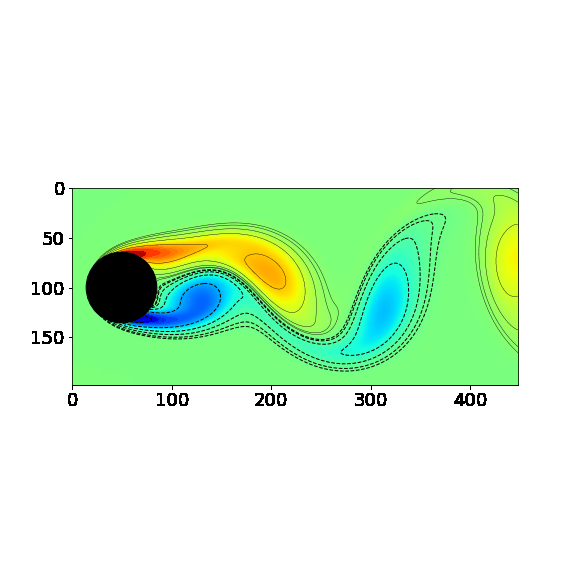

## Coarsen each flow field by a factor of $20$ in each direction, and build a library of these coarsened measurements (i.e., a matrix, where each column  contains these downsampled measurements).

In [4]:
X1=np.copy(np.real(np.reshape(X[:,0],(449,199))))
size = (np.array(X1.shape) * (1/20)).astype(int)
s=size[0]*size[1]
size

array([22,  9])

In [5]:
## Downsample Images (Build Theta)
from skimage.transform import resize

M = X.shape[1]

Theta = np.zeros((s,M))
for k in range(M):
    temp = np.copy(np.real(np.reshape(X[:,k],(449,199))))
    tempSmall = resize(temp, size, anti_aliasing=True) # Make figure size from (449,199) to (22,9)
    Theta[:,k] = np.reshape(tempSmall,s)

Theta.shape

(198, 151)

In [6]:
def plotFlow_Small(X):    
    ## Plot Mode 2
    vortmin = -5
    vortmax = 5
    V2 = np.copy(np.real(np.reshape(X,(22,9))))
    V2 = V2.T

    # normalize values... not symmetric
    minval = np.min(V2)
    maxval = np.max(V2)

    if np.abs(minval) < 5 and np.abs(maxval) < 5:
        if np.abs(minval) > np.abs(maxval):
            vortmax = maxval
            vortmin = -maxval
        else:
            vortmin = minval
            vortmax = -minval

    V2[V2 > vortmax] = vortmax
    V2[V2 < vortmin] = vortmin
    
    #plt.figure(figsize=(22, 9))
    plt.imshow(V2,cmap='jet',vmin=vortmin,vmax=vortmax)

    cvals = np.array([-4,-2,-1,-0.5,-0.25,-0.155])
    plt.contour(V2,cvals*vortmax/5,colors='k',linestyles='dashed',linewidths=1)
    plt.contour(V2,np.flip(-cvals)*vortmax/5,colors='k',linestyles='solid',linewidths=0.4)

    plt.scatter(2,4,5000,color='k') # draw cylinder


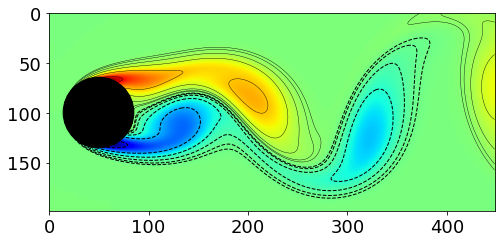

In [7]:
# Plot Mode 2 of the original flow field
plotFlow(X[:,1])

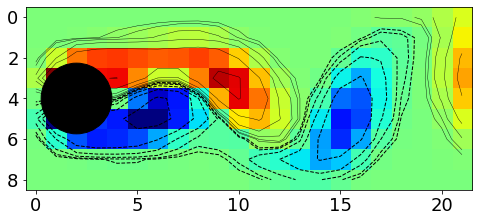

In [8]:
# Plot Mode 2 of the flow field in these new coordinates
plotFlow_Small(Theta[:,1]) 

## Plot a movie of the flow field in these new coordinates

In [9]:
## Plot a movie of the flow field in these new coordinates 

def createMovie_Small(X):
    plt.rcParams['figure.figsize'] = [8, 8]
    filenames = []
    for i in range(151):
        plotFlow_Small(X[:,i])
        filename = './pics/full'+str(i)+'.png'
        filenames.append(filename)
        plt.savefig(filename)
        plt.close()
    with imageio.get_writer('vortices_small.gif', mode='I') as writer:
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
    for filename in set(filenames):
        os.remove(filename)
        
createMovie_Small(Theta)

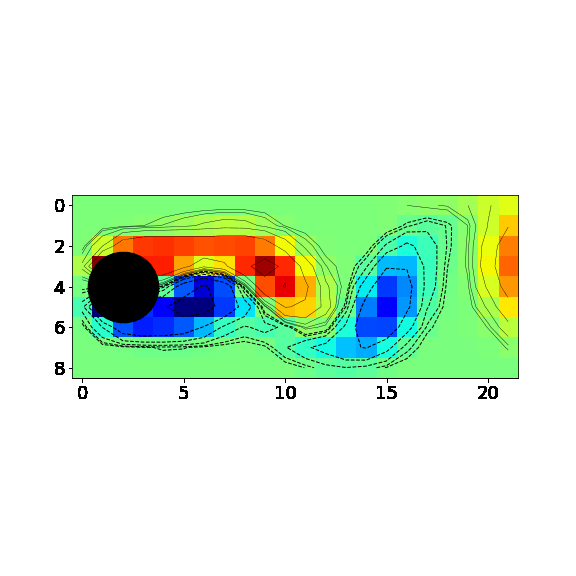

In [10]:
## Renormalize Columns of Theta
normTheta = np.zeros(M)
for k in range(M):
    normTheta[k] = np.linalg.norm(Theta[:,k])
    Theta[:,k] = Theta[:,k]/normTheta[k]

## Pick a column of the full flow field matrix and add Gaussian random noise to this field.

Text(0.5, 1.0, 'The noisy mode 2 of the original flow field')

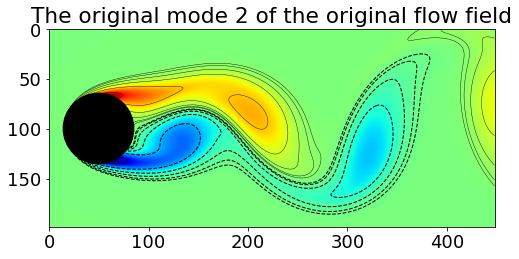

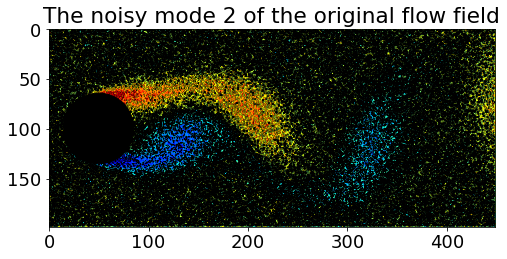

In [35]:
## Pick a column of the full flow field matrix and add Gaussian random noise to this field.

x1 = np.copy(X[:,1])
y = np.copy(x1) + 1*np.random.randn(*x1.shape) # Random noise

plt.figure()
plotFlow(x1)
plt.title('The original mode 2 of the original flow field')

plt.figure()
plotFlow(y)
plt.title('The noisy mode 2 of the original flow field')

## Downsample noisy field by a factor of 20.

In [36]:
## Downsample noisy field by a factor of 20
size1= (np.array(X1.shape) * (1/20)).astype(int)
temp1 = np.reshape(np.copy(y),(449,199))
tempSmall1 = resize(temp1, size1, anti_aliasing=True)
y1 = np.reshape(tempSmall1, s)

## Use sparse representation for classification (SRC) to find the closest downsampled library element. Then use this column of full field library as your reconstructed estimate.

In [37]:
## L1 Search, Noise

from scipy.optimize import minimize
y2 = np.copy(y1)
eps = 10

# L1 Minimum norm solution s_L1
def L1_norm(x):
    return np.linalg.norm(x,ord=1)

constr = ({'type': 'ineq', 'fun': lambda x:  eps - np.linalg.norm(Theta @ x - y2,2)})
x0 = np.linalg.pinv(Theta) @ y2 # initialize with L2 solution
res = minimize(L1_norm, x0, method='SLSQP',constraints=constr)
s4 = res.x

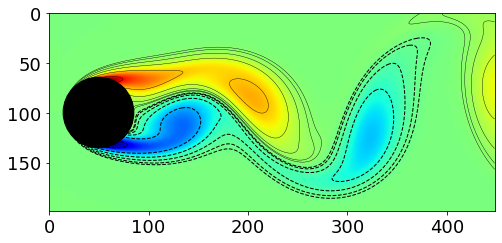

In [38]:
## SRC denoising
err = np.zeros(151)
for k in range(151):
    L = range(k,(k+1))
    err[k] = np.linalg.norm(y- X[:,L] @ (s4[L]/normTheta[L]))/np.linalg.norm(y)
    
Err=err.tolist()  
Index=Err.index(min(Err))
plotFlow(X[:,Index])

## Try this approach with different levels of noise added to the original flow field. See how much noise is required before the method breaks

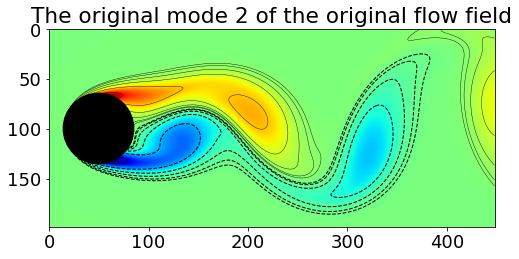

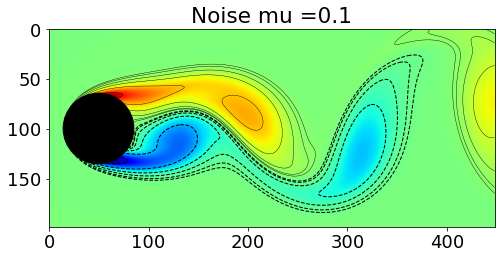

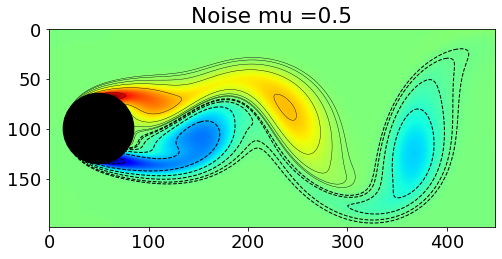

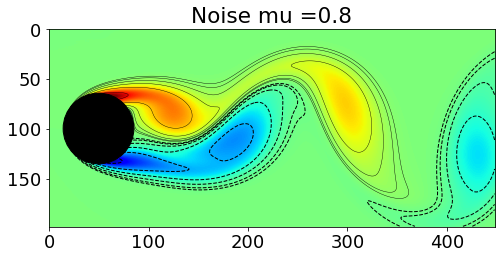

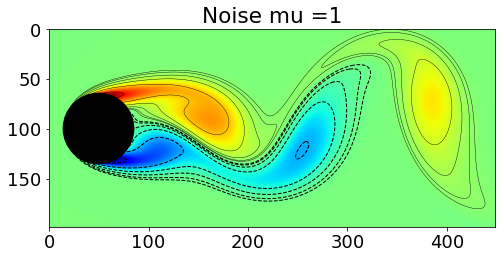

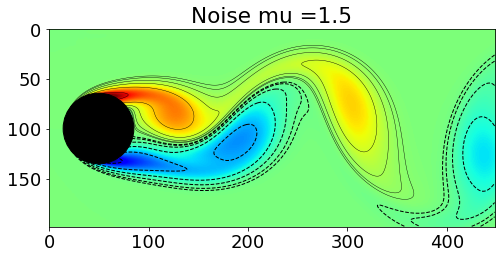

In [41]:
## Determine how much noise is required before the method breaks
w1 = np.copy(X[:,1])
plt.figure()
plotFlow(w1)
plt.title('The original mode 2 of the original flow field')

Mu=[0.1,0.5, 0.8,1, 1.5]
for mu in Mu :
    z = np.copy(w1) + mu*np.random.randn(*w1.shape) # Random noise
    # Downsample noisy field by a factor of 20
    size2= (np.array(X1.shape) * (1/20)).astype(int)
    temp2 = np.reshape(np.copy(z),(449,199))
    tempSmall2 = resize(temp2, size2, anti_aliasing=True)
    z1 = np.reshape(tempSmall2, s)

    # L1 Search, Noise
    z2 = np.copy(z1)
    eps = 10

    constr = ({'type': 'ineq', 'fun': lambda x:  eps - np.linalg.norm(Theta @ x - z2,2)})
    w0 = np.linalg.pinv(Theta) @ z2 # initialize with L2 solution
    res = minimize(L1_norm, w0, method='SLSQP',constraints=constr)
    s5 = res.x

    # SRC denoising
    err1 = np.zeros(151)
    for k in range(151):
        L = range(k,(k+1))
        err1[k] = np.linalg.norm(z- X[:,L] @ (s5[L]/normTheta[L]))/np.linalg.norm(z)
        
    
    Err1=err1.tolist()  
    Index1=Err1.index(min(Err1))
    
    plt.figure()
    plotFlow(X[:,Index1]) 
    plt.title('Noise mu =' + str(mu) )